# CAMELYON16

## Background

- [CAMELYON16](https://camelyon16.grand-challenge.org)
    - Challenge: Automated dectection of metastases from H&E whole-slide images (WSIs) of sentinel lymph nodes from breast cancer patients.
    - Winning approach from Beck et al. from HMS/BI/MIT
        - [results](https://camelyon16.grand-challenge.org/PerTeamResult/?id=BIDMC_CSAIL)
        - [presentation](https://camelyon16.grand-challenge.org/site/CAMELYON16/serve/public_html/Results/Presentations/Camelyon16_BIDMC_CSAIL.pdf/)
        - Uses transfer learning of [GoogLeNet](http://www.cv-foundation.org/openaccess/content_cvpr_2015/papers/Szegedy_Going_Deeper_With_2015_CVPR_paper.pdf).
- [Image Segmentation to predict left ventrile from cardiac MRI scans](https://gist.github.com/ajsander/b65061d12f50de3cef5d#file-fcn_tutorial-ipynb)
    - Full method published by Booz Allen Data scientist.
    - Uses 8 layer Fully-convolutional network.
        - [This presentation is cool](http://tutorial.caffe.berkeleyvision.org/caffe-cvpr15-pixels.pdf)
            - [paper](https://people.eecs.berkeley.edu/~jonlong/long_shelhamer_fcn.pdf)
    - Used by NVIDIA in their Deep Learning Institute course to teach image segmentation (see [here](https://nvidia.qwiklab.com/focuses/preview/2193).

## Setup Environment

In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
!nvidia-smi

Thu May 25 00:26:29 2017       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 375.51                 Driver Version: 375.51                    |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  GRID K520           Off  | 0000:00:03.0     Off |                  N/A |
| N/A   41C    P0    39W / 125W |      0MiB /  4036MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

GPU is fired up and ready to go.

## Load data

In [3]:
import os.path as osp
import openslide
from pathlib import Path

BASE_TRUTH_DIR = Path('/home/ubuntu/data/camelyon16/Ground_Truth_Extracted/Mask')

slide_path = '/home/ubuntu/data/camelyon16/Tumor_009.tif'
truth_path = str(BASE_TRUTH_DIR / 'Tumor_009_Mask.tif')

slide = openslide.open_slide(slide_path)
truth = openslide.open_slide(truth_path)

"Original Slide dimensions %dx%d" % slide.dimensions
"Original Truth dimensions %dx%d" % truth.dimensions

'Original Slide dimensions 97792x217088'

'Original Truth dimensions 97792x217088'

These slides are huge -- 21 billion pixels!  We'll break this huge image into 256x256x3 patches for training.

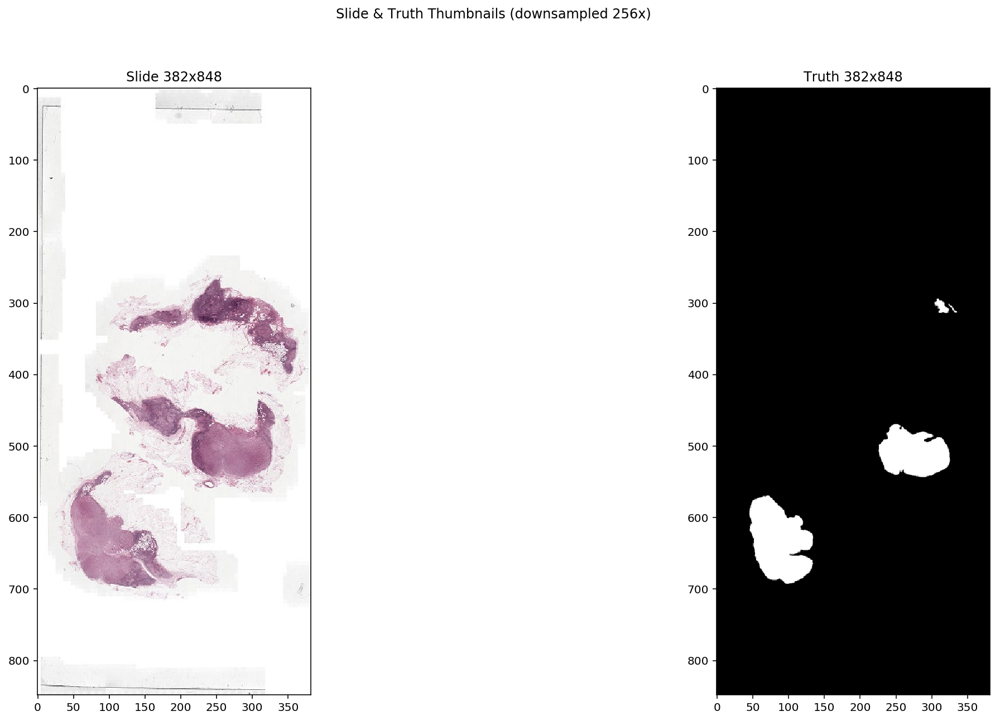

In [4]:
thumbnail = slide.get_thumbnail((slide.dimensions[0] / 256, slide.dimensions[1] / 256))
thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 256, truth.dimensions[1] / 256)) 

f, axes = plt.subplots(1, 2, figsize=(20, 10));
ax = axes.ravel()
ax[0].imshow(thumbnail);
ax[0].set_title('Slide %dx%d' % thumbnail.size)
ax[1].imshow(thumbnail_truth.convert('L'), cmap='gray');
ax[1].set_title('Truth %dx%d' % thumbnail_truth.size)
f.suptitle('Slide & Truth Thumbnails (downsampled 256x)');

Each pixel in these thumbnails corresponds to a 256x256 patch that can be used for training.  White areas in truth mask are cancer regions.

## Tissue area selection

We can use Otsu's method to find areas on slide with tissue.  Pixels with binary==False will be set of patches available for training.

In [5]:
from skimage.filters import threshold_otsu

img = np.array(thumbnail.convert('L')) # convert to grayscale
thresh = threshold_otsu(img)
binary = img > thresh

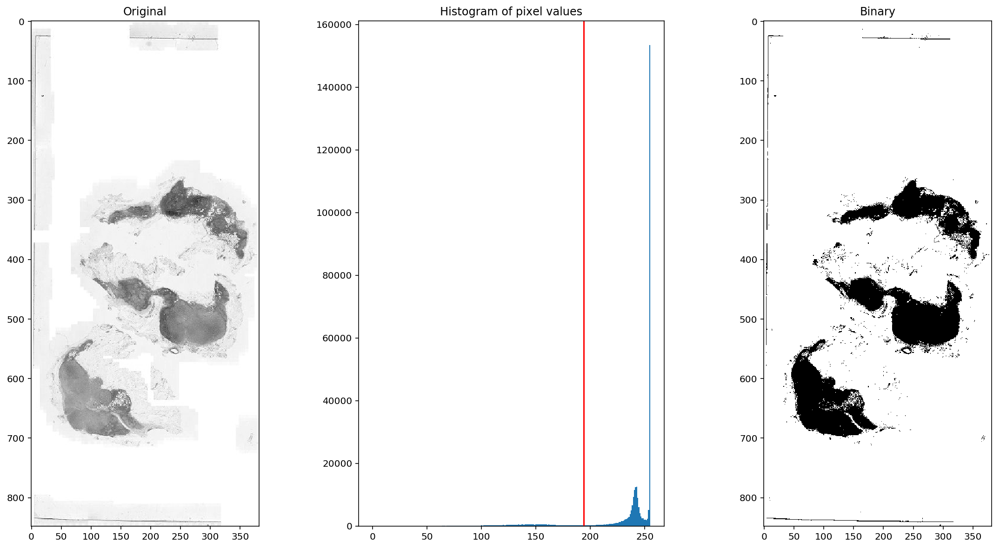

In [6]:
f, axes = plt.subplots(1, 3, figsize=(20, 10));
ax = axes.ravel();
ax[0].imshow(img, cmap='gray');
ax[0].set_title('Original');
ax[1].hist(img.ravel(), bins=256);
ax[1].set_title('Histogram of pixel values');
ax[1].axvline(thresh, color='r');
ax[2].imshow(binary, cmap='gray');
ax[2].set_title('Binary');

## Example Patches

In [7]:
from openslide.deepzoom import DeepZoomGenerator 

tiles = DeepZoomGenerator(slide, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth = DeepZoomGenerator(truth, tile_size=256, overlap=0, limit_bounds=False)

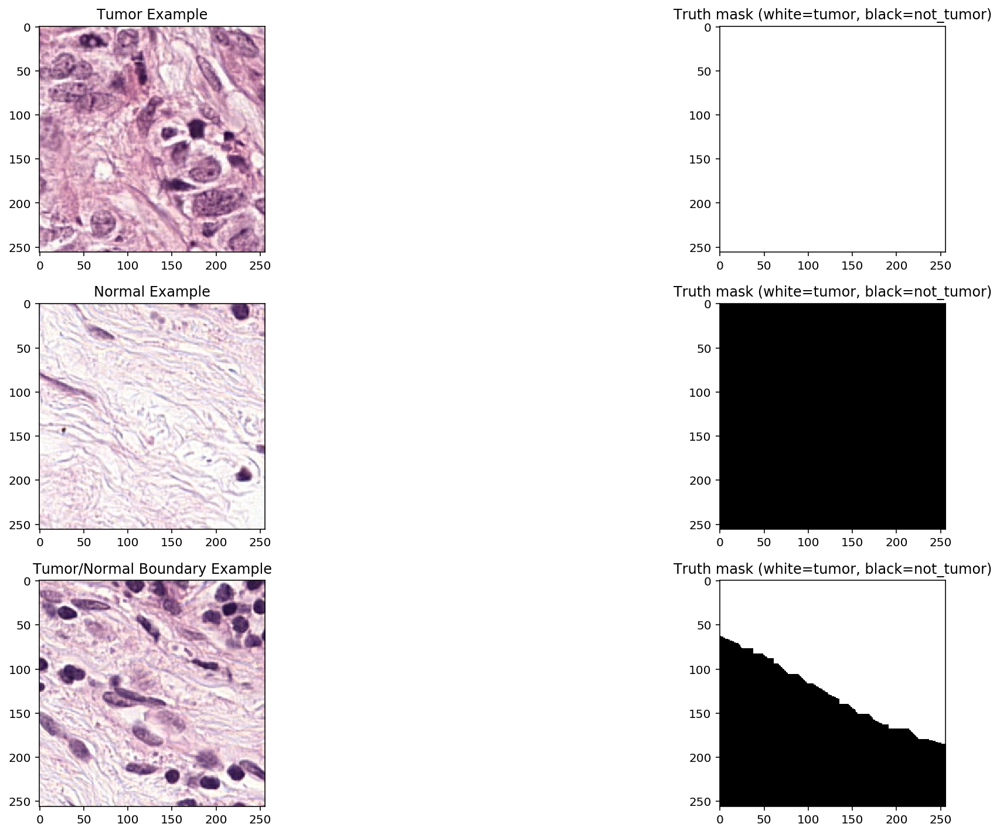

In [8]:
f, axes = plt.subplots(3, 2, figsize=(20, 10))
axes[0, 0].imshow(tiles.get_tile(tiles.level_count-1, (100, 680)));
axes[0, 0].set_title('Tumor Example');
axes[0, 1].imshow(tiles_truth.get_tile(tiles_truth.level_count-1, (100, 680)));
axes[0, 1].set_title('Truth mask (white=tumor, black=not_tumor)')
axes[1, 0].imshow(tiles.get_tile(tiles.level_count-1, (97, 693)));
axes[1, 0].set_title('Normal Example');
axes[1, 1].imshow(tiles_truth.get_tile(tiles_truth.level_count-1, (97, 693)));
axes[1, 1].set_title('Truth mask (white=tumor, black=not_tumor)')
axes[2, 0].imshow(tiles.get_tile(tiles.level_count-1, (97, 692)));
axes[2, 0].set_title('Tumor/Normal Boundary Example');
axes[2, 1].imshow(tiles_truth.get_tile(tiles_truth.level_count-1, (97, 692)));
axes[2, 1].set_title('Truth mask (white=tumor, black=not_tumor)');
plt.tight_layout();

The boundary example will probably be challenging to predict correctly.

## Data generator

In [258]:
def find_patches_from_slide(slide_path, base_truth_dir=BASE_TRUTH_DIR, filter_non_tissue=True):
    """Returns a dataframe of all patches in slide
    input: slide_path: path to WSI file
    output: samples: dataframe with the following columns:
        slide_path: path of slide
        is_tissue: sample contains tissue
        is_tumor: truth status of sample
        tile_loc: coordinates of samples in slide
        
    
    option: base_truth_dir: directory of truth slides
    option: filter_non_tissue: Remove samples no tissue detected
    """
    base_truth_dir = Path(base_truth_dir)
    slide_contains_tumor = osp.basename(slide_path).startswith('Tumor_')
    
    with openslide.open_slide(slide_path) as slide:
        thumbnail = slide.get_thumbnail((slide.dimensions[0] / 256, slide.dimensions[1] / 256))
    
    thumbnail_grey = np.array(thumbnail.convert('L')) # convert to grayscale
    thresh = threshold_otsu(thumbnail_grey)
    binary = thumbnail_grey > thresh
    
    patches = pd.DataFrame(pd.DataFrame(binary).stack())
    patches['is_tissue'] = ~patches[0]
    patches.drop(0, axis=1, inplace=True)
    patches['slide_path'] = slide_path
    
    if slide_contains_tumor:
        truth_slide_path = base_truth_dir / osp.basename(slide_path).replace('.tif', '_Mask.tif')
        with openslide.open_slide(str(truth_slide_path)) as truth:
            thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 256, truth.dimensions[1] / 256)) 
        
        patches_y = pd.DataFrame(pd.DataFrame(np.array(thumbnail_truth.convert("L"))).stack())
        patches_y['is_tumor'] = patches_y[0] > 0
        patches_y.drop(0, axis=1, inplace=True)

        samples = pd.concat([patches, patches_y], axis=1)
    else:
        samples = patches
        samples['is_tumor'] = False
    
    if filter_non_tissue:
        samples = samples[samples.is_tissue == True] # remove patches with no tissue
    samples['tile_loc'] = list(samples.index)
    samples.reset_index(inplace=True, drop=True)
    return samples 

In [260]:
all_tissue_samples = find_patches_from_slide(slide_path)
print('Total patches in slide: %d' % len(all_tissue_samples))
all_tissue_samples.iloc[:10]
all_tissue_samples.is_tumor.value_counts()

Total patches in slide: 34528


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/home/ubuntu/data/camelyon16/Tumor_009.tif,False,"(13, 165)"
1,True,/home/ubuntu/data/camelyon16/Tumor_009.tif,False,"(14, 165)"
2,True,/home/ubuntu/data/camelyon16/Tumor_009.tif,False,"(21, 275)"
3,True,/home/ubuntu/data/camelyon16/Tumor_009.tif,False,"(22, 248)"
4,True,/home/ubuntu/data/camelyon16/Tumor_009.tif,False,"(22, 249)"
5,True,/home/ubuntu/data/camelyon16/Tumor_009.tif,False,"(24, 8)"
6,True,/home/ubuntu/data/camelyon16/Tumor_009.tif,False,"(24, 9)"
7,True,/home/ubuntu/data/camelyon16/Tumor_009.tif,False,"(24, 10)"
8,True,/home/ubuntu/data/camelyon16/Tumor_009.tif,False,"(24, 11)"
9,True,/home/ubuntu/data/camelyon16/Tumor_009.tif,False,"(24, 12)"


False    20911
True     13617
Name: is_tumor, dtype: int64

This slide has 34.5k patches containing tissue. Roughly 39% of these patches contain tumor cells.

In [226]:
import cv2
from keras.utils.np_utils import to_categorical

NUM_CLASSES = 2 # not_tumor, tumor

def gen_imgs(samples, batch_size, base_truth_dir=BASE_TRUTH_DIR, shuffle=True):
    """This function returns a generator that 
    yields tuples of (
        X: tensor, float - [batch_size, 256, 256, 3]
        y: tensor, int32 - [batch_size, 256, 256, NUM_CLASSES]
    )
    
    
    input: samples: samples dataframe
    input: batch_size: The number of images to return for each pull
    output: yield (X_train, y_train): generator of X, y tensors
    
    option: base_truth_dir: path, directory of truth slides
    option: shuffle: bool, if True shuffle samples
    """
    
    num_samples = len(samples)
    while 1: # Loop forever so the generator never terminates
        if shuffle:
            samples = samples.sample(frac=1) # shuffle samples
        
        for offset in range(0, num_samples, batch_size):
            batch_samples = samples.iloc[offset:offset+batch_size]
        
            images = []
            masks = []
            for _, batch_sample in batch_samples.iterrows():
                slide_contains_tumor = osp.basename(batch_sample.slide_path).startswith('Tumor_')
                
                with openslide.open_slide(batch_sample.slide_path) as slide:
                    tiles = DeepZoomGenerator(slide, tile_size=256, overlap=0, limit_bounds=False)
                    img = tiles.get_tile(tiles.level_count-1, batch_sample.tile_loc[::-1])
                    
                # only load truth mask for tumor slides
                if slide_contains_tumor:
                    truth_slide_path = base_truth_dir / osp.basename(slide_path).replace('.tif', '_Mask.tif')
                    with openslide.open_slide(str(truth_slide_path)) as truth:
                        truth_tiles = DeepZoomGenerator(truth, tile_size=256, overlap=0, limit_bounds=False)
                        mask = truth_tiles.get_tile(truth_tiles.level_count-1, batch_sample.tile_loc[::-1])
                        mask = (cv2.cvtColor(np.array(mask), cv2.COLOR_RGB2GRAY) > 0).astype(int)
                else:
                    mask = np.zeros((256, 256))

                images.append(np.array(img))
                masks.append(mask)

            X_train = np.array(images)
            y_train = np.array(masks)
            y_train = to_categorical(y_train, num_classes=2).reshape(y_train.shape[0], 256, 256, 2)
            yield X_train, y_train

Note:
>Our model output and label tensors are of shape batch_sizex256x256x2.  So for each pixel we have a probability that they belong to class [not_tumor, tumor].  Label tensors are binary [0, 1].

In [242]:
sample_gen = gen_imgs(all_tissue_samples.sample(32, random_state=42), 32, shuffle=False)

In [243]:
%time example_X, example_y  = next(sample_gen)

CPU times: user 1.01 s, sys: 60 ms, total: 1.07 s
Wall time: 1.06 s


In [244]:
example_X.shape

(32, 256, 256, 3)

In [245]:
example_y.shape

(32, 256, 256, 2)

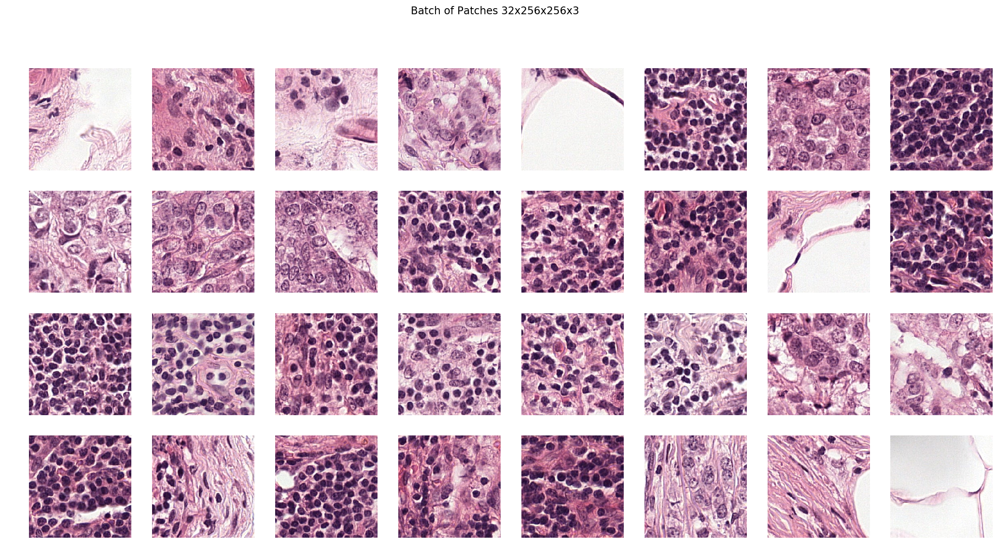

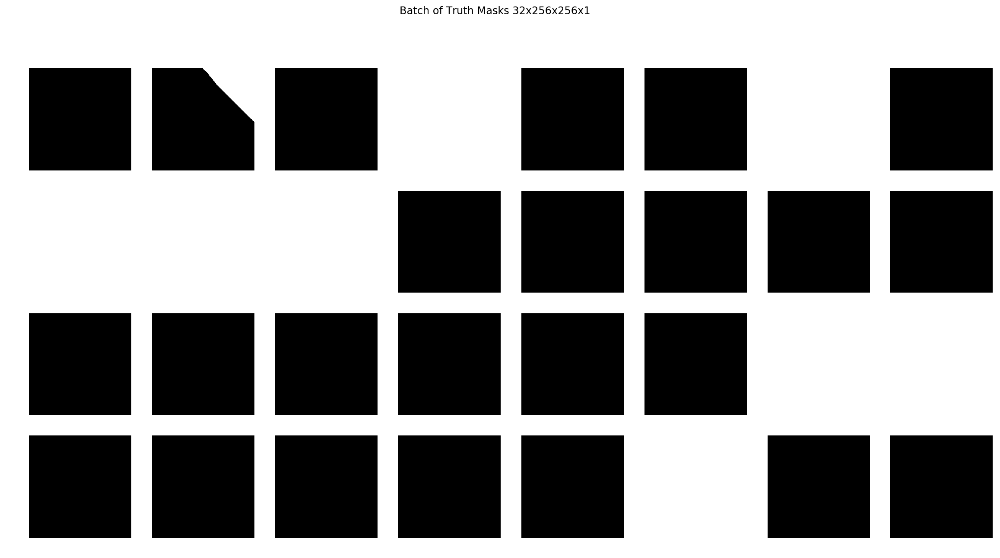

In [246]:
f, axes = plt.subplots(4, 8, figsize=(20, 10));
ax = axes.flatten()
for i in range(0, example_X.shape[0]):
    _ = ax[i].imshow(example_X[i]);
    _ = ax[i].axis('off');
f.suptitle('Batch of Patches 32x256x256x3');
    
f, axes = plt.subplots(4, 8, figsize=(20, 10));
ax = axes.flatten()    
for i in range(0, example_X.shape[0]):
    _ = ax[i].imshow(example_y[i].argmax(axis=2), cmap='gray', vmin=0, vmax=1);
    _ = ax[i].axis('off');
f.suptitle('Batch of Truth Masks 32x256x256x1');

## Define network

This first image segmentation model is based on a fully convolutional network used to predict the left ventricle from cardiac MRI scans (described [here](https://gist.github.com/ajsander/b65061d12f50de3cef5d#file-fcn_tutorial-ipynb)).

Architecture:

1. Convolution1, 5 x 5 kernel, stride 2, outputs 128x128x100
2. Maxpooling1, 2 x 2 window, stride 2, outputs 64x64x100
3. Convolution2, 5 x 5 kernel, stride 2, outputs 32x32x200
4. Maxpooling2, 2 x 2 window, stride 2, outputs 16x16x200
5. Convolution3, 3 x 3 kernel, stride 1, outputs 16x16x300
6. Convolution4, 3 x 3 kernel, stride 1, outputs 16x16x300
7. Convolution5, 1x1 kernel, stride 1, outputs 16x16x2
8. Deconvolution, 31 x 31 kernel, stride 16, outputs 256x256x2

This network is XXX layers deep with XXXX connections and XXX parameters.

In [109]:
from keras.models import Sequential
from keras.layers import Lambda, Dropout
from keras.layers.convolutional import Convolution2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D

model = Sequential()
model.add(Lambda(lambda x: x / 255.0 - 0.5, input_shape=(256, 256, 3)))
model.add(Convolution2D(100, (5, 5), strides=(2, 2), activation='elu', padding='same'))
model.add(MaxPooling2D())
model.add(Convolution2D(200, (5, 5), strides=(2, 2), activation='elu', padding='same'))
model.add(MaxPooling2D())
model.add(Convolution2D(300, (3, 3), activation='elu', padding='same'))
model.add(Convolution2D(300, (3, 3), activation='elu',  padding='same'))
model.add(Dropout(0.1))
model.add(Convolution2D(2, (1, 1))) # this is called upscore layer for some reason?
model.add(Conv2DTranspose(2, (31, 31), strides=(16, 16), activation='softmax', padding='same'))

model.compile(loss='categorical_crossentropy', optimizer='adam')

Note:
> Some model details.  We're using ELU activations instead of RELU units.  I've seen better performance with these, and they address the vanishing gradient problem LINK.
There's a dropout layer after our main conv layers.  We're using cross-entropy of our softmax predictions as our loss function to measure model performance.  Lastly, we use the ADAM optimizer because I'm lazy and I don't want to deal with tuning learning-rate knobs.

## Train model

In [114]:
BATCH_SIZE = 32
N_EPOCHS = 5

NUM_SAMPLES = 5000

In [115]:
samples = find_patches_from_slide(slide_path)
samples = samples.sample(NUM_SAMPLES, random_state=42)
samples.reset_index(drop=True, inplace=True)

In [116]:
from sklearn.model_selection import StratifiedShuffleSplit

# split samples into train and validation set
# use StratifiedShuffleSplit to ensure both sets have same proportions of tumor patches
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(samples, samples["is_tumor"]):
        train_samples = samples.loc[train_index]
        validation_samples = samples.loc[test_index]

In [117]:
from datetime import datetime

## TODO Add checkpoint mechanism to save old model before generating new

train_generator = gen_imgs(train_samples, BATCH_SIZE)
validation_generator = gen_imgs(validation_samples, BATCH_SIZE)

# Train model
train_start_time = datetime.now()
model.fit_generator(train_generator, np.ceil(len(train_samples) / BATCH_SIZE),
    validation_data=validation_generator,
    validation_steps=np.ceil(len(validation_samples) / BATCH_SIZE),
    epochs=N_EPOCHS)

train_end_time = datetime.now()
print("Model training time: %.1f minutes" % ((train_end_time - train_start_time).seconds / 60,))

Epoch 1/5
125/125 [==============================] - 165s - loss: 0.4944 - val_loss: 0.4118
Epoch 2/5
125/125 [==============================] - 156s - loss: 0.3666 - val_loss: 0.3660
Epoch 3/5
125/125 [==============================] - 155s - loss: 0.3148 - val_loss: 0.4095
Epoch 4/5
125/125 [==============================] - 156s - loss: 0.3347 - val_loss: 0.2846
Epoch 5/5
125/125 [==============================] - 158s - loss: 0.2993 - val_loss: 0.3234


Model training time: 13.2 minutes


Over several runs, 5 epochs was the sweet spot for this number of samples (5000) and dropout rate (0.1).

TODO: implement checkpoints to choose best model in training run.  Here we should've use Epoch 4's results as it looks like we start overfitting in epoch 5.

In [122]:
# Save model
model.save('model.h5')

## Evaluate model

### Predict single patches

In [197]:
def predict_from_model(patch, model):
    """Predict which pixels are tumor.
    
    input: patch: 256x256x3, rgb image
    input: model: keras model
    output: prediction: 256x256x1, per-pixel tumor probability
    """
    
    prediction = model.predict(patch.reshape(1, 256, 256, 3))
    prediction = prediction[:, :, :, 1].reshape(256, 256)
    return prediction

In [365]:
import matplotlib.gridspec as gridspec

def plot_blend(patch, prediction, ax, alpha=0.75):
    """alpha blend patch and prediction.
    https://matplotlib.org/examples/pylab_examples/layer_images.html
    
    input: patch: 256x256x3, rgb image
    input: prediction: 256x256x1, per-pixel tumor probability
    input: ax: maplotlib Axes object
    input: alpha: alpha blend
    """
    
    dx, dy = 0.05, 0.05
    x = np.arange(0, patch.shape[1] - 1, dx)
    y = np.arange(0, patch.shape[0] - 1, dy)
    xmin, xmax, ymin, ymax = np.amin(x), np.amax(x), np.amin(y), np.amax(y)
    extent = xmin, xmax, ymin, ymax

    # fig = plt.figure(frameon=False, figsize=(10, 5))
    Z1 = cv2.cvtColor(patch, code=cv2.COLOR_RGB2GRAY)
    Z2 = prediction

    im1 = ax.imshow(Z1, cmap='gray', extent=extent)
    im2 = ax.imshow(Z2, cmap='jet', alpha=alpha, vmin=0.0, vmax=1.0,
                     extent=extent)
    ax.axis('off');

def plot_patch_with_pred(patch, truth, prediction, title_str='', alpha=0.6):
    """
    input: patch: 256x256x3, rgb image
    input: truth: 256x256x2, onehot output classes (not_tumor, tumor)
    input: prediction: 256x256x1, per-pixel tumor probability
    """
    gs = gridspec.GridSpec(2, 4, width_ratios=[10, 10, 19, 1])
    ax0 = plt.subplot(gs[0, 0])
    ax1 = plt.subplot(gs[0, 1])
    ax2 = plt.subplot(gs[1, 0])
    ax3 = plt.subplot(gs[1, 1])
    ax4 = plt.subplot(gs[:, 2])
    axc = plt.subplot(gs[:, 3])

    ax0.imshow(patch);
    ax0.set_title('Original')
    
    ax1.imshow(truth.argmax(axis=2), cmap='gray', vmin=0, vmax=1);
    ax1.set_title('Truth mask (white=tumor, black=not_tumor)')
    
    p = ax2.imshow(prediction, cmap='jet', vmin=0, vmax=1);
    ax2.set_title('Prediction heatmap')

    ax3.imshow((prediction > 0.5).astype(np.int), cmap='gray', vmin=0, vmax=1);
    ax3.set_title('Prediction mask (white=tumor, black=not_tumor)')
    
    plot_blend(patch, prediction, ax4, alpha)
    ax4.set_title('Original+Prediction blend')
    
    fig = plt.gcf()
    fig.set_size_inches(20, 10)
    fig.suptitle(title_str)
    fig.colorbar(p, cax=axc, orientation="vertical")
    axc.set_title('Probability pixel is tumor')

#### Easy tumor patch

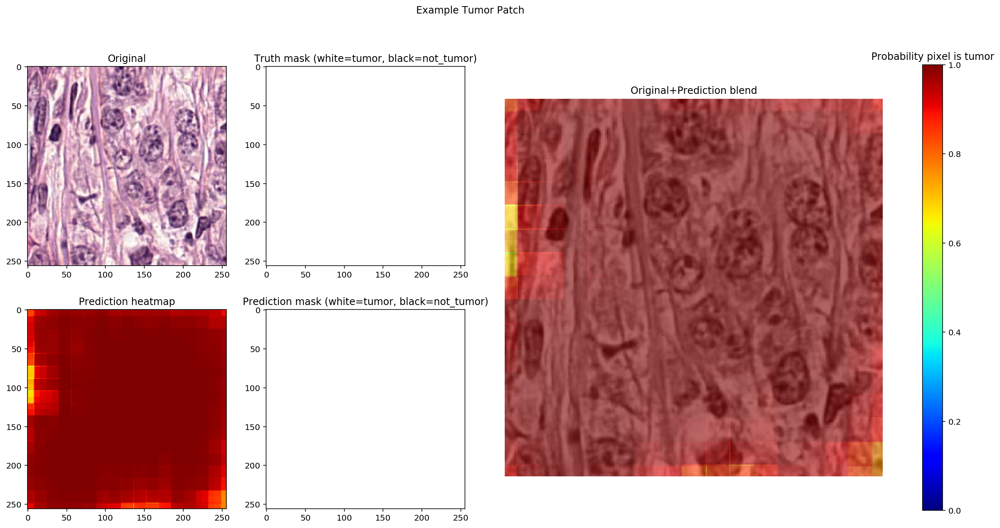

In [359]:
example_patch = example_X[-3]
example_truth = example_y[-3]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example Tumor Patch')

These calls look good.  Easy all tumor case.

count    65536.000000
mean         0.982097
std          0.036798
min          0.567210
25%          0.981854
50%          0.994518
75%          0.998532
max          0.999744
dtype: float64


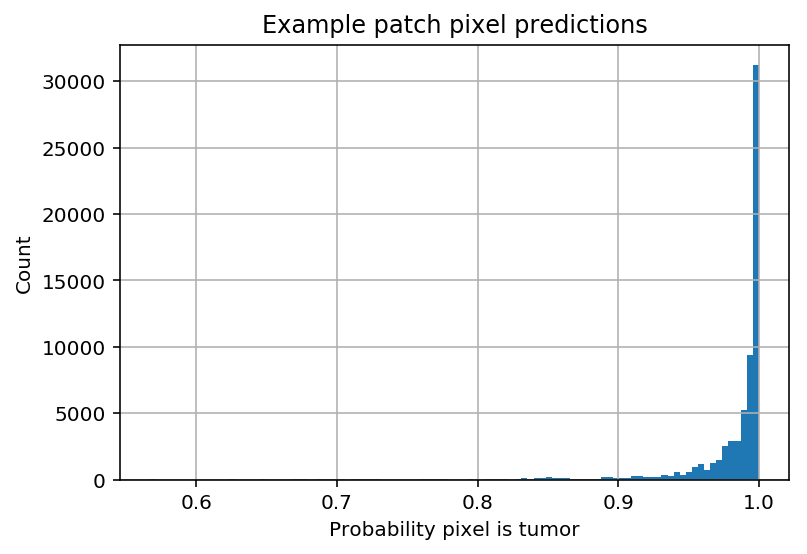

In [360]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

#### Easy normal patch

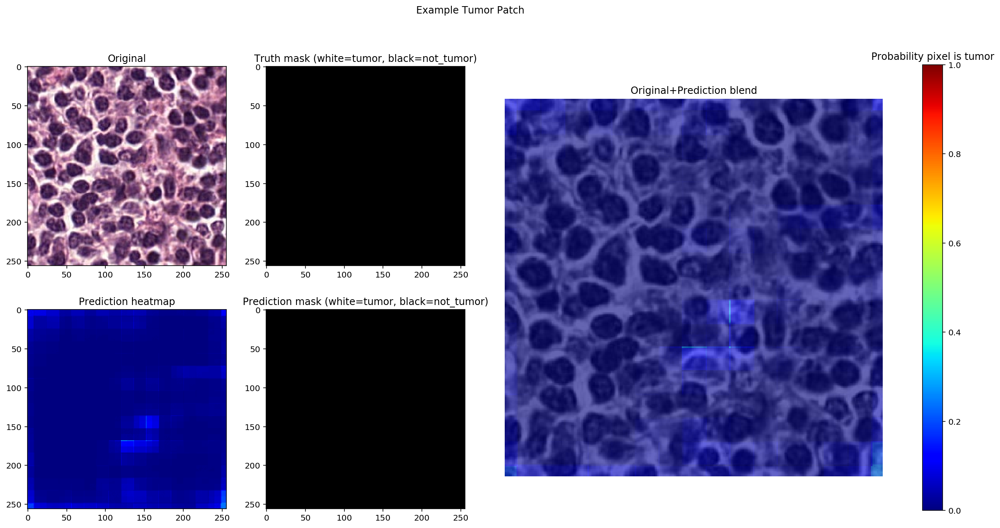

In [252]:
example_patch = example_X[16]
example_truth = example_y[16]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example Tumor Patch')

Normal case called correctly.

count    65536.000000
mean         0.014217
std          0.022776
min          0.000009
25%          0.001481
50%          0.005783
75%          0.017305
max          0.294220
dtype: float64


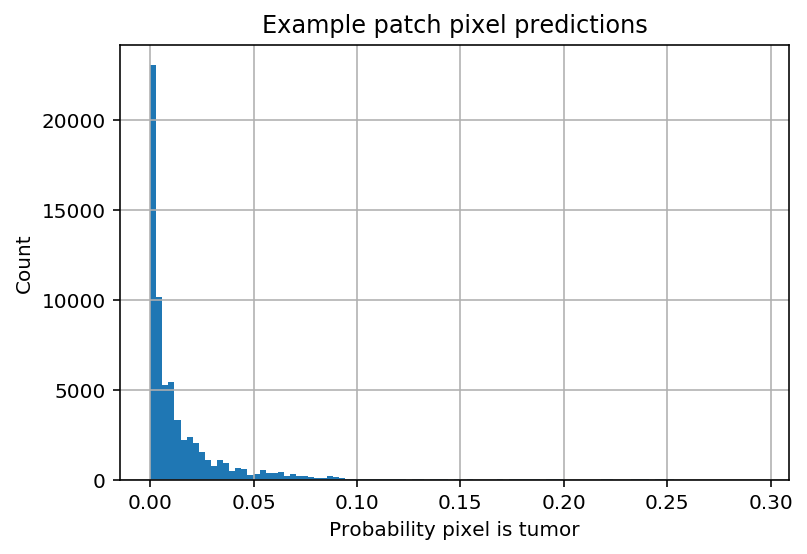

In [253]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

#### Tough border patch

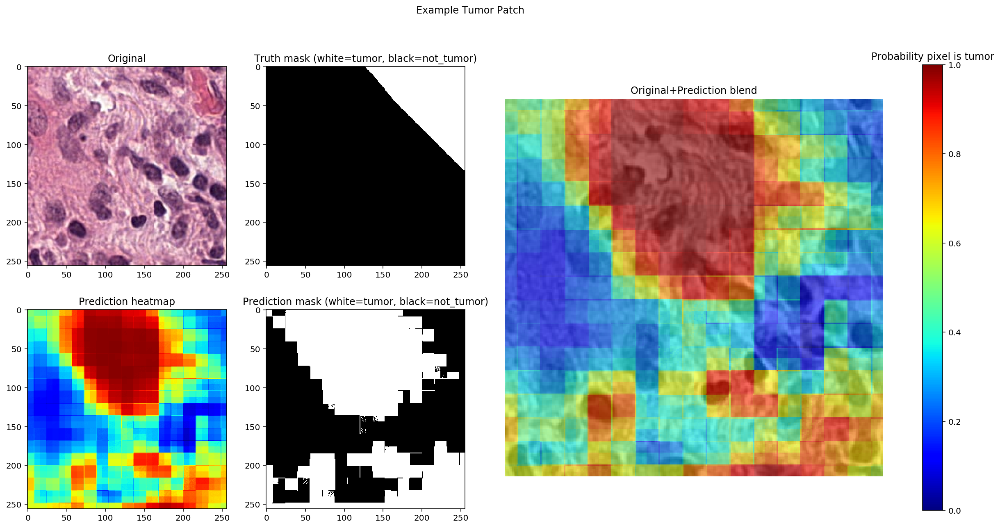

In [254]:
example_patch = example_X[1]
example_truth = example_y[1]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example Tumor Patch')

The model is predicting more tumor than expected.  I could see why it would be thinking the upper portion is cancer.  **Craig**, what do you think?

count    65536.000000
mean         0.547110
std          0.280591
min          0.030329
25%          0.304281
50%          0.517326
75%          0.806375
max          0.994189
dtype: float64


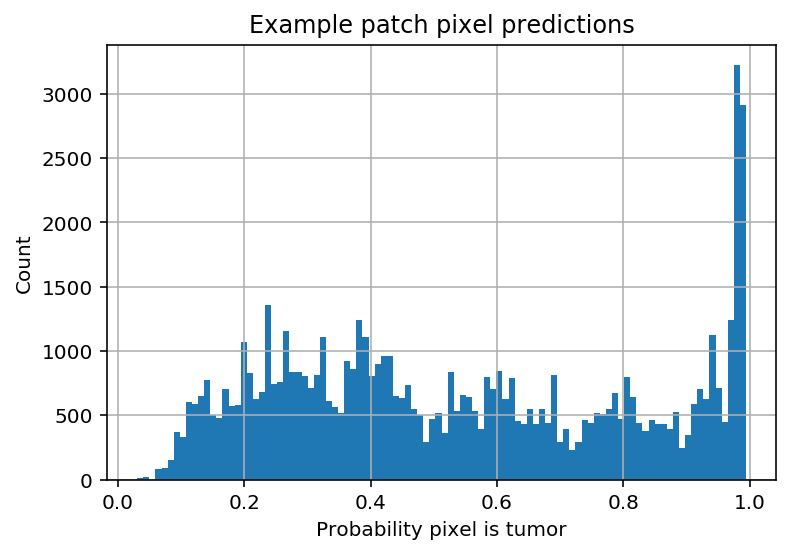

In [255]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

#### Tough normal patch

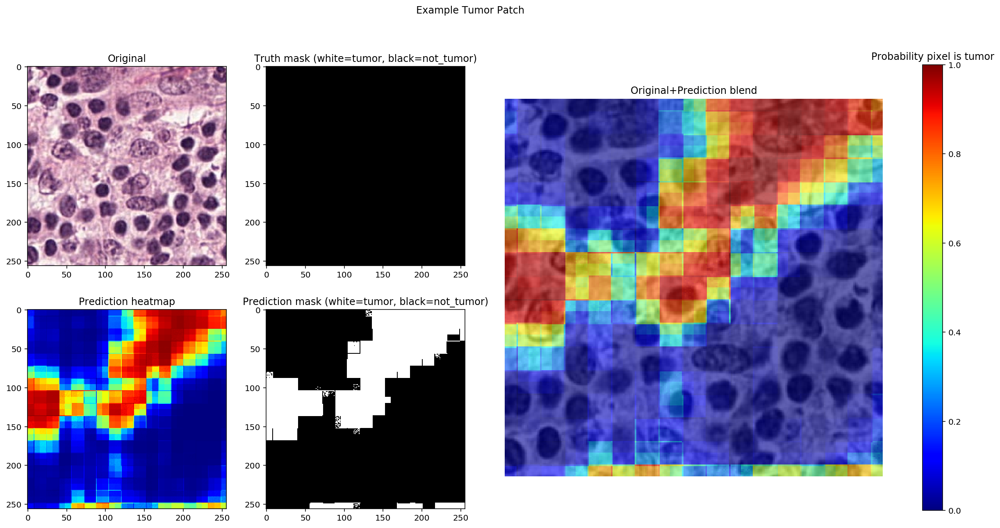

In [256]:
example_patch = example_X[-13]
example_truth = example_y[-13]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example Tumor Patch')

To my untrained eye, this looks like our model is correctly picking up a contiguous sliver of cancer cells. **Craig**?

count    65536.000000
mean         0.301590
std          0.341977
min          0.000423
25%          0.027000
50%          0.106522
75%          0.595986
max          0.990993
dtype: float64


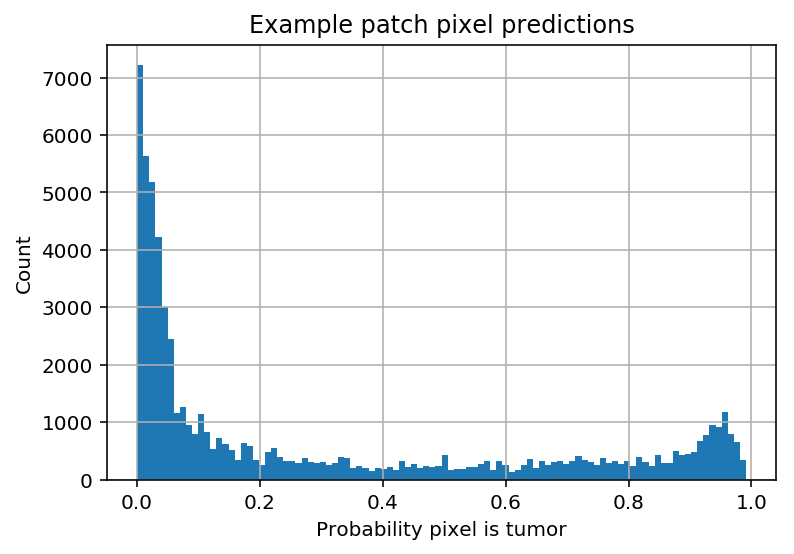

In [257]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

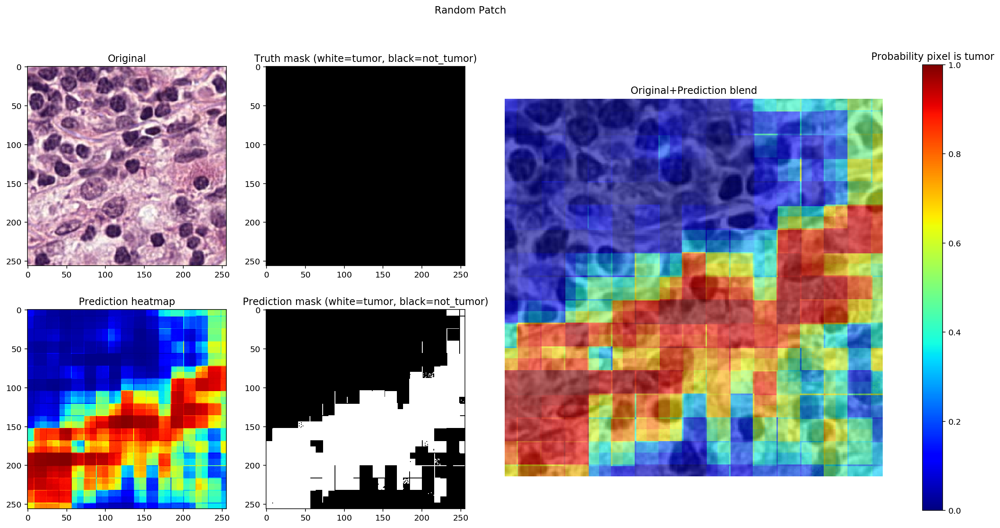

In [213]:
def get_random_patch_from_samples(samples, random_state=None):
    X_i, y_i = next(gen_imgs(samples.sample(1, random_state=random_state), 1))
    return X_i, y_i

X_i, y_i = get_random_patch_from_samples(all_tissue_samples)
pred_i = predict_from_model(X_i, model)
plot_patch_with_pred(X_i[0], y_i[0], pred_i, title_str='Random Patch')

**Craig** is this correct calling or is the model mistaking some types of normal cells for cancer?

### Predict whole slide

In [265]:
all_samples = find_patches_from_slide(slide_path, filter_non_tissue=False)
print('Total patches in slide: %d' % len(all_samples))
all_samples.iloc[:5]
all_samples.is_tumor.value_counts()

Total patches in slide: 323936


,is_tissue,slide_path,is_tumor,tile_loc
0,False,/home/ubuntu/data/camelyon16/Tumor_009.tif,False,"(0, 0)"
1,False,/home/ubuntu/data/camelyon16/Tumor_009.tif,False,"(0, 1)"
2,False,/home/ubuntu/data/camelyon16/Tumor_009.tif,False,"(0, 2)"
3,False,/home/ubuntu/data/camelyon16/Tumor_009.tif,False,"(0, 3)"
4,False,/home/ubuntu/data/camelyon16/Tumor_009.tif,False,"(0, 4)"


False    309550
True      14386
Name: is_tumor, dtype: int64

In [391]:
def predict_batch_from_model(patches, model):
    """Predict which pixels are tumor.
    
    input: patch: batch_size256x256x3, rgb image
    input: model: keras model
    output: prediction: 256x256x1, per-pixel tumor probability
    """
    batch_size = patches.shape[0]
    
    predictions = model.predict(patches)
    predictions = predictions[:, :, :, 1]
    return predictions

In [425]:
from tqdm import tqdm

n_samples = len(all_samples)
n_cols = int(slide.dimensions[0] / 256)
n_rows = int(slide.dimensions[1] / 256)
assert n_cols * n_rows == n_samples

thumbnail = slide.get_thumbnail((n_cols, n_rows))
thumbnail = np.array(thumbnail)

# batch_size = n_cols
batch_size = 32
output_thumbnail_preds = list()
    
for offset in tqdm(list(range(0, n_samples, batch_size))):
    batch_samples = all_samples.iloc[offset:offset+batch_size]
    
    if batch_samples.is_tissue.nunique() == 1 and batch_samples.iloc[0].is_tissue == False:
        # all patches in this row do not have tissue, skip them all
        output_thumbnail_preds.append(np.zeros(batch_size, dtype=np.float32))
    else:
        X, _ = next(gen_imgs(batch_samples, batch_size, shuffle=False))
        preds = predict_batch_from_model(X, model)
        output_thumbnail_preds.append(preds.mean(axis=(1,2)))

output_thumbnail_preds = np.array(output_thumbnail_preds)


100%|██████████| 10123/10123 [55:36<00:00,  3.03it/s] 


In [430]:
output_thumbnail_preds = output_thumbnail_preds.reshape(n_rows, n_cols)

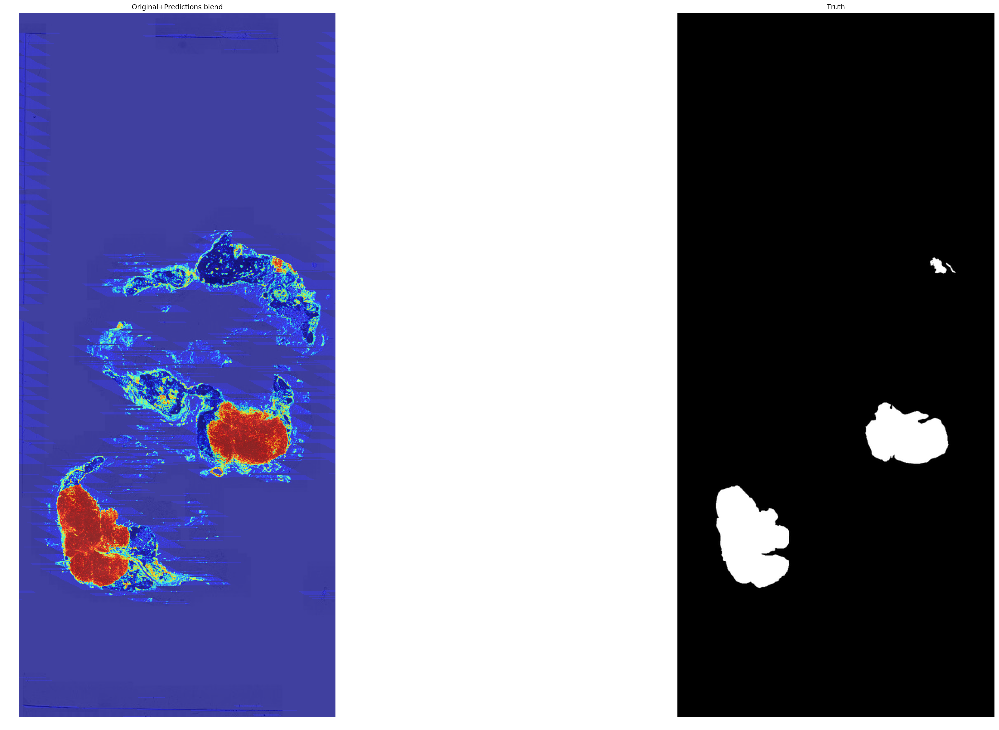

In [432]:
f, axes = plt.subplots(1, 2, figsize=(40, 18))
ax = axes.flatten()
plot_blend(thumbnail, output_thumbnail_preds, ax=ax[0])

thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 256, truth.dimensions[1] / 256)) 
ax[1].imshow(thumbnail_truth.convert('L'), cmap='gray');
ax[0].set_title('Original+Predictions blend')
ax[1].set_title('Truth')
ax[1].axis('off');
plt.tight_layout();

A bit noisy but overall we're finding the four main lessions!

## TODOs

In [ ]:
# calculate performance metrics (accuracy, recall, precision, F1, Dice cooefficient)

In [ ]:
# Add 'on-the-fly' data augmentations.  Flip, rotate, crop, shift, etc.

In [ ]:
# Train on larger dataset

In [ ]:
# Try different network architectures